In [1]:
from google.colab import drive
drive.mount('/content/drive/')
import pandas as pd
import numpy as np


Mounted at /content/drive/


In [2]:
data=pd.read_csv("/content/drive/My Drive/4523 Project/【Dataset】marketing_campaign.csv",sep='\t')

In [3]:
import numpy as np

import pandas as pd

from matplotlib import pyplot as plt

import seaborn as sns

import plotly.express as px

from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [4]:
#data=pd.read_csv("marketing_campaign.csv", sep="\t")
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


In [5]:
!pip install dataprep

     |████████████████████████████████| 3.5 MB 7.3 MB/s 
     |████████████████████████████████| 1.1 MB 47.5 MB/s 
     |████████████████████████████████| 943 kB 68.5 MB/s 
     |████████████████████████████████| 719 kB 69.5 MB/s 
     |████████████████████████████████| 848 kB 57.7 MB/s 
     |████████████████████████████████| 366 kB 77.1 MB/s 
     |████████████████████████████████| 63 kB 3.4 MB/s 
     |████████████████████████████████| 1.5 MB 41.2 MB/s 
     |████████████████████████████████| 158 kB 83.6 MB/s 
     |████████████████████████████████| 10.1 MB 13.1 MB/s 
     |████████████████████████████████| 192 kB 63.3 MB/s 
     |████████████████████████████████| 271 kB 74.0 MB/s 
     |████████████████████████████████| 160 kB 57.4 MB/s 
     |████████████████████████████████| 132 kB 79.4 MB/s 
     |████████████████████████████████| 49 kB 8.3 MB/s 
     |████████████████████████████████| 1.5 MB 57.4 MB/s 
     |████████████████████████████████| 743 kB 64.2 MB/s 
  Created wheel fo

NumExpr defaulting to 2 threads.



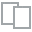
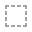
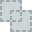
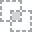
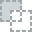
...
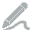
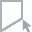
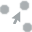
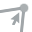
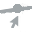

In [6]:
from dataprep.eda import plot
plot(data)

In [7]:
#Data cleaning
data.dropna(inplace=True)
data.drop(columns=['Z_Revenue', 'Z_CostContact'], inplace=True)
#data = data[data["Marital_Status"].isin(["Married","Together","Divorced","Single"])]

Text(0.5, 1.0, 'New Income')

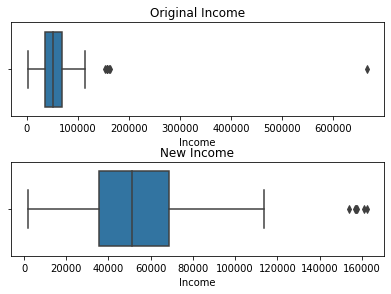

In [8]:
#Income outlier
fig,axx=plt.subplots(2,1)
a=sns.boxplot(data["Income"],ax=axx[0])
a.set_title("Original Income")
fig.tight_layout()
#There's an outlier
data=data[data['Income']<200000]
#Drop the outlier
b=sns.boxplot(data["Income"],ax=axx[1])
b.set_title("New Income")

In [9]:
!pip install palettable -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [10]:
import palettable
from palettable.cartocolors.qualitative import Bold_9

Data Manipulation

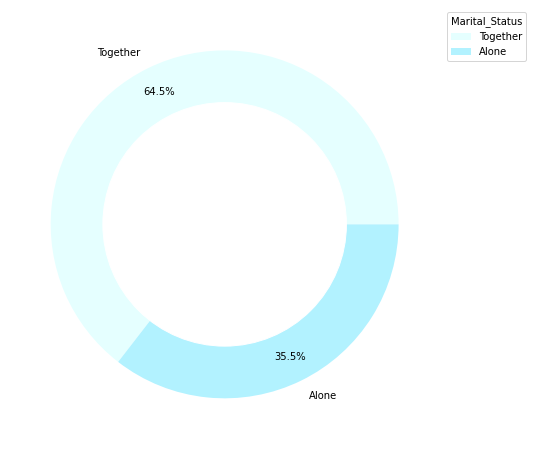

In [11]:
# Marital_Status into 2 categories

data['Marital_Status'].replace(['YOLO', 'Absurd', 'Alone','Widow','Divorced','Single'], 'Alone', inplace=True)
data['Marital_Status'].replace(['Married','Together'], 'Together', inplace=True)


sizes = dict(data['Marital_Status'].value_counts())

plt.figure(figsize=(12, 8))
plt.pie(sizes.values(), labels=sizes.keys(), autopct="%.1f%%", pctdistance=0.85,colors=palettable.lightbartlein.sequential.Blues10_5.mpl_colors[0:5])
plt.legend(title="Marital_Status", labels=sizes.keys(), bbox_to_anchor=(1, 1))

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)

plt.show()

In [156]:
#没有去重

In [13]:
data[data.duplicated(keep=False)].sort_values(by='Income')
#Delete duplicated
#data[data.duplicated(keep='first')]
#data.drop_duplicates(inplace=True)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response


In [14]:
#Reduce high cardinality
from datetime import datetime
data["Dt_Customer"] = data["Dt_Customer"].apply(lambda row: datetime.strptime(row,"%d-%m-%Y"))
now = datetime.now()
data["enrollment"] = data.apply(lambda row:(now-row["Dt_Customer"]).days,axis = 1)


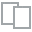
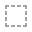
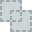
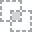
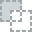
...
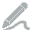
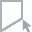
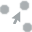
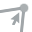
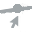

In [16]:
plot(data['enrollment'])

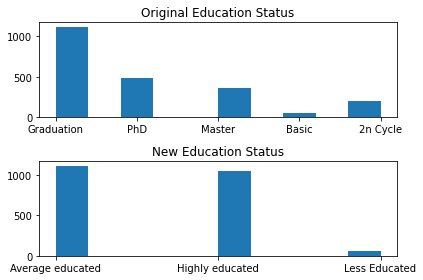

In [15]:
#Education integration
figure,ax=plt.subplots(2,1)
ax[0].hist(data['Education'])
ax[0].set_title("Original Education Status")
data['Education'].replace({'Basic':'Less Educated','2n Cycle':'Highly educated','Graduation':'Average educated','Master':'Highly educated','PhD':'Highly educated'},inplace=True)
ax[1].hist(data['Education'])
ax[1].set_title("New Education Status")
figure.tight_layout()

In [17]:
data["Age"] = 2021-data["Year_Birth"]


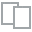
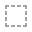
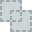
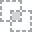
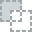
...
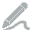
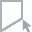
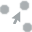
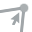
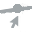

In [18]:
plot(data['Age'])

In [32]:
#Add column
data['MntTotal'] = data.filter(like='Mnt').sum(axis=1) #sum of amounts spent on all products
data['NumTotalPurchases'] = data.filter(regex='Num[^Deals].+Purchases').sum(axis=1) #total number of purchases
data.drop(data.loc[(data['NumTotalPurchases'] == 0) & (data['MntTotal'] != 0)]
          .index, inplace=True) #drop unmatched data
data['AvgCheck'] = data['MntTotal'] / data['NumTotalPurchases']

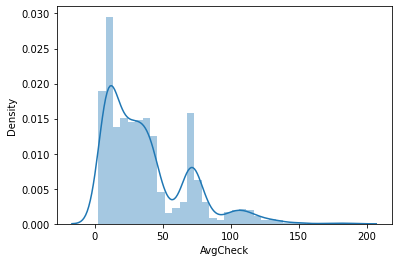

In [52]:

sns.distplot(data['AvgCheck'])


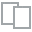
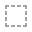
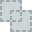
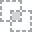
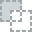
...
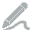
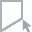
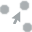
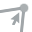
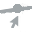

In [53]:
plot(data['AvgCheck'])

In [33]:
data['Wines Frequency']=data['MntWines']/data['MntTotal']*100
data['Meat Frequency']=data['MntMeatProducts']/data['MntTotal']*100
data['Fruit Frequency']=data['MntFruits']/data['MntTotal']*100
data['Fish Frequency']=data['MntFishProducts']/data['MntTotal']*100
data['Sweet Frequency']=data['MntSweetProducts']/data['MntTotal']*100
data['Gold Frequency']=data['MntGoldProds']/data['MntTotal']*100


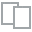
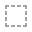
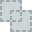
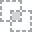
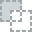
...
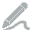
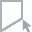
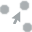
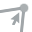
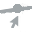

In [42]:
plot(data.filter(regex='[.]*Frequency'))

Data preprocessing

In [54]:
#Encode
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["Education"] = le.fit_transform(data["Education"]) 
data["Marital_Status"] = le.fit_transform(data["Marital_Status"])

In [55]:
#Rescale
from sklearn.preprocessing import scale #transfer to normal distribution
scale_feature = ['AvgCheck', 'Income', 'NumTotalPurchases', 'MntTotal',"Age"]
for feature in scale_feature:
    data[feature] = scale(data[feature])


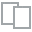
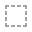
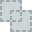
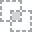
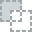
...
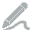
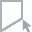
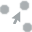
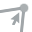
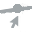

In [56]:
from dataprep.eda import plot
plot(data)

k-means(2 methods)

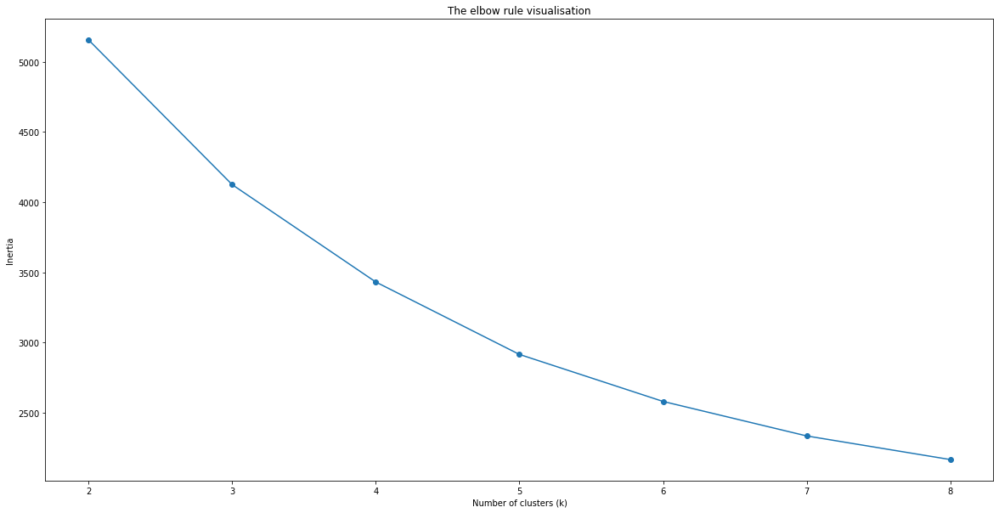

In [58]:
options = range(2,9) #find k
inertias = []

for n_clusters in options:
    model = KMeans(n_clusters, random_state=42, init='k-means++').fit(data[scale_feature])
    inertias.append(model.inertia_)

plt.figure(figsize=(20,10))    
plt.title("The elbow rule visualisation")
plt.plot(options, inertias, '-o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia');

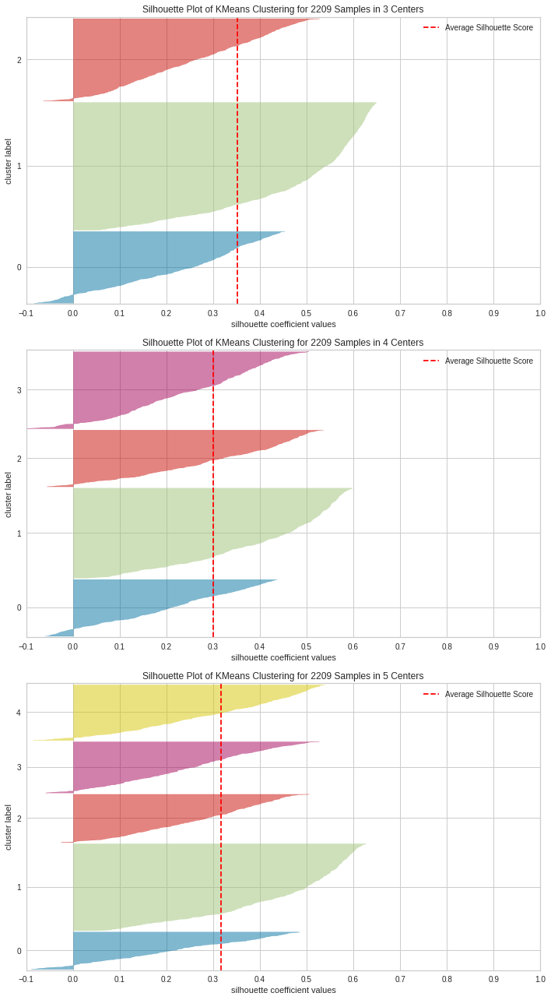

In [59]:
#Choose from 4 and 5
from yellowbrick.cluster import SilhouetteVisualizer #轮廓值法-k
k_range = range(3, 6)
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

for i in k_range:   
    model = KMeans(i, init='k-means++', n_init=100, random_state=42)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick', ax=axes[i-3])
    visualizer.fit(data[scale_feature])
    visualizer.finalize()
    axes[i-3].set_xlim(-0.1, 1)
    
plt.tight_layout()

PCA test result

In [60]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=42)
kmeans.fit(data[scale_feature])

pred = kmeans.predict(data[scale_feature])

data_cleaned_clustered = data.copy()
data_cleaned_clustered['Cluster'] = pred + 1 # +feature 

ppt不搞3d

In [76]:
#scale_feature = ['AvgCheck', 'Income', 'NumTotalPurchases', 'MntTotal',"Age"]
#Maybe we could choose x,y,z from scale_feature randomly to see which combination has the best visual effects
fig = px.scatter_3d(data_cleaned_clustered, x="Income", y="AvgCheck", z="Age", color='Cluster', width=800, height=800)
fig.show() #k-means是有效的 

In [61]:
pca = PCA(n_components=2)
pca_data = pca.fit_transform(data[scale_feature])
pca_df = pd.DataFrame.from_records(data=pca_data, columns=["x1","x2"])
pca_df["Cluster"] = pred + 1

In [62]:
fig = px.scatter(pca_df, x="x1", y="x2", color='Cluster', width=800, height=800)
fig.show()

Cluster analysis

In [180]:
#Take a look
data_cleaned_clustered

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,enrollment,Age,MntTotal,NumTotalPurchases,AvgCheck,Cluster
0,5524,1957,0,0,0.290892,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,3374,0.986095,1.672294,1.309385,1.193012,4
1,2174,1954,0,0,-0.264782,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,2824,1.236281,-0.965425,-1.196331,-1.023291,5
2,4141,1965,0,1,0.925765,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,3023,0.318933,0.277123,1.030972,0.040866,1
3,6182,1984,0,1,-1.192852,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,2850,-1.265577,-0.922292,-0.917918,-0.954118,2
4,5324,1981,1,1,0.298195,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,2872,-1.015391,-0.310143,0.195733,-0.246577,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,0,1,0.436241,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,3092,0.152143,1.214426,0.474146,1.535418,3
2236,4001,1946,1,1,0.567739,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,2730,1.903443,-0.273646,0.334940,-0.264601,4
2237,7270,1981,0,0,0.236380,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,2866,-1.015391,1.048531,0.752559,1.041753,1
2238,8235,1956,1,1,0.814197,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,2867,1.069490,0.388272,1.170178,0.085453,4


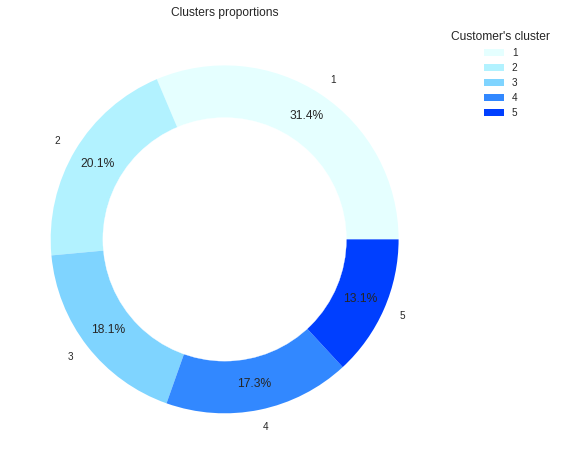

In [63]:
#See their occupation
sizes = dict(data_cleaned_clustered['Cluster'].value_counts())

plt.figure(figsize=(12, 8))
plt.title("Clusters proportions")
plt.pie(sizes.values(), labels=sorted(sizes.keys()), autopct="%.1f%%", pctdistance=0.85,colors=palettable.lightbartlein.sequential.Blues10_5.mpl_colors[0:5])
plt.legend(title="Customer's cluster", labels=sorted(sizes.keys()), bbox_to_anchor=(1, 1))

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)

plt.show()

In [ ]:
#Property: Income, Age, Marital_Status,Education--用户画像

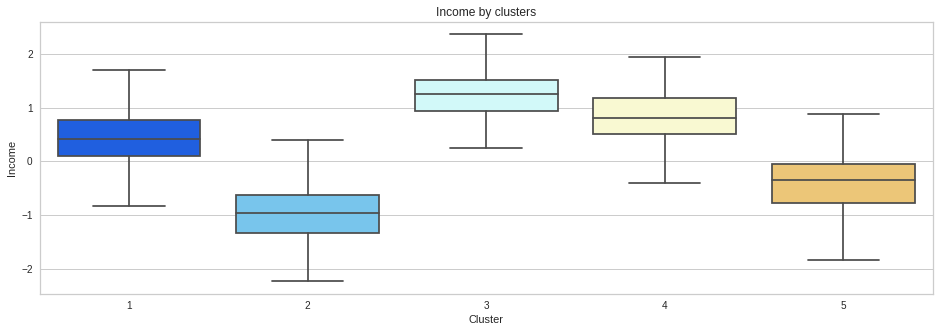

In [64]:
plt.figure(figsize=(16,5))
plt.title(f'Income by clusters')

colors = palettable.lightbartlein.diverging.BlueOrange10_6.mpl_colors
ax = sns.boxplot(data=data_cleaned_clustered, x='Cluster', y='Income', showfliers=False,palette=colors)


plt.show()
#

Cluster 1&5 medium  Cluster 2 Low  Cluster 3&4 High

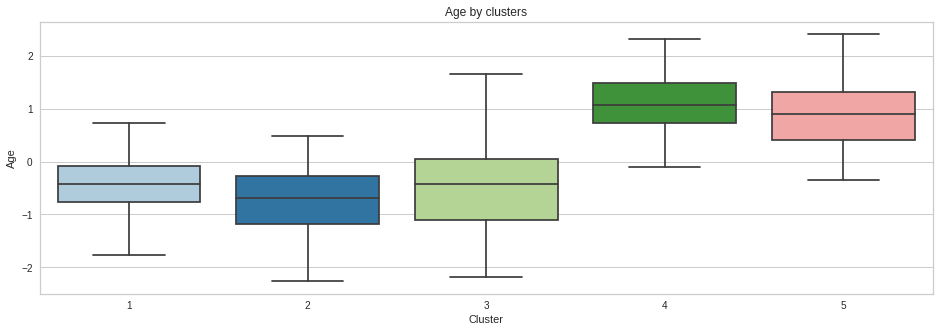

In [65]:
plt.figure(figsize=(16,5))
plt.title(f'Age by clusters')
colors=palettable.colorbrewer.qualitative.Paired_8.mpl_colors
ax = sns.boxplot(data=data_cleaned_clustered, x='Cluster', y='Age', showfliers=False,palette=colors)
plt.show()

Cluster 4&5 Older  Cluster 1&3&2 Young

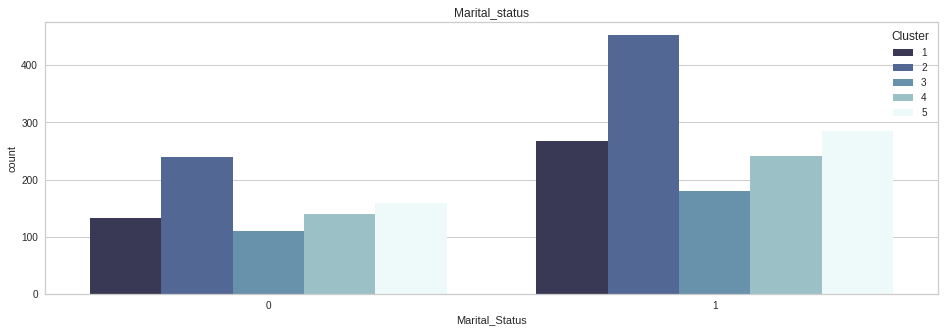

In [66]:
plt.figure(figsize=(16,5))
colors=palettable.cmocean.sequential.Ice_6.mpl_colors[1:]
plt.title(f'Marital_status')
sns.countplot(data=data_cleaned_clustered, x='Marital_Status', hue='Cluster',palette=colors,saturation=0.6)

plt.show() #0--Along 1--Together

Mainly Together

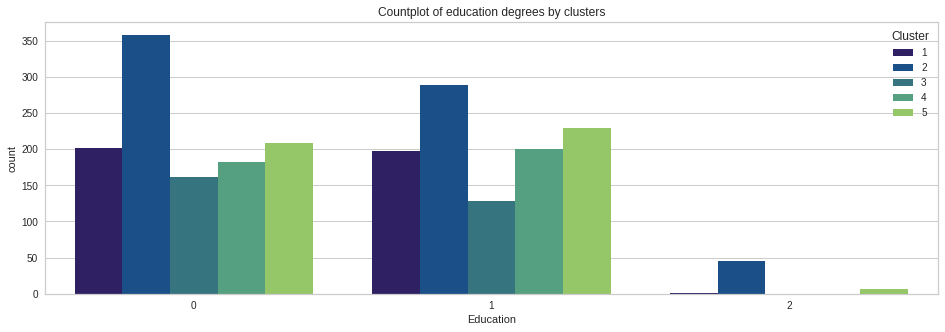

In [67]:
plt.figure(figsize=(16,5))
colors=palettable.cmocean.sequential.Haline_6.mpl_colors
plt.title(f'Countplot of education degrees by clusters')
sns.countplot(data=data_cleaned_clustered, x='Education', hue='Cluster',palette=colors,saturation=0.8)
plt.show() #0-Average 1-Highly 2-Less

In [ ]:
# Consuming behaviors

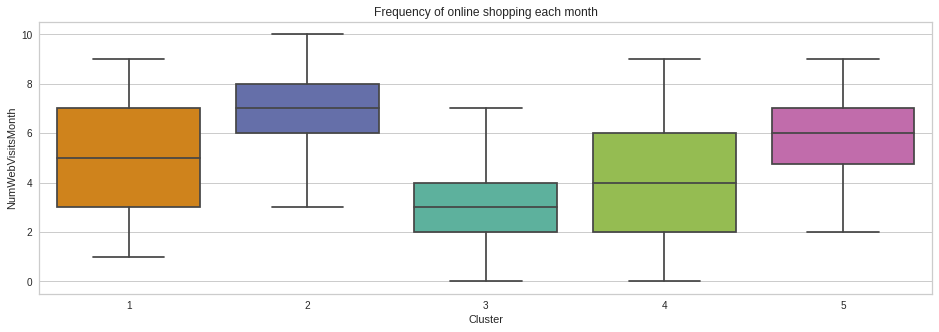

In [71]:
#Shopping place
plt.figure(figsize=(16,5))
colors=palettable.cartocolors.qualitative.Vivid_7.mpl_colors
plt.title(f'Frequency of online shopping each month')
ax = sns.boxplot(data=data_cleaned_clustered, x='Cluster', y='NumWebVisitsMonth', showfliers=False,palette=colors,saturation=0.8)
plt.show()

2 high; 

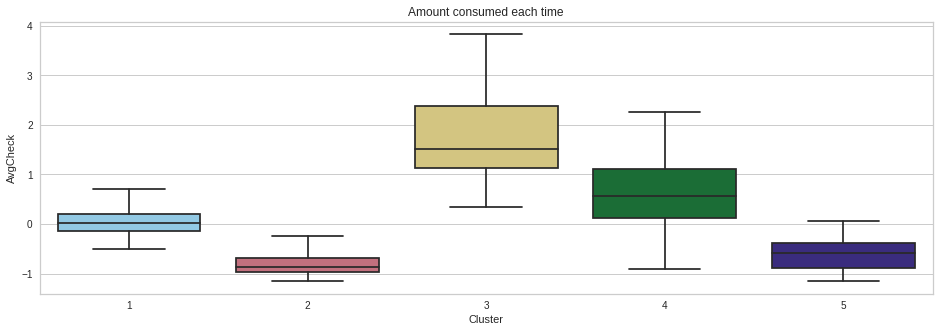

In [74]:
plt.figure(figsize=(16,5))
colors=palettable.cartocolors.qualitative.Safe_6.mpl_colors
plt.title(f'Amount consumed each time')
ax = sns.boxplot(data=data_cleaned_clustered, x='Cluster', y='AvgCheck', showfliers=False,palette=colors,saturation=0.8)
plt.show()

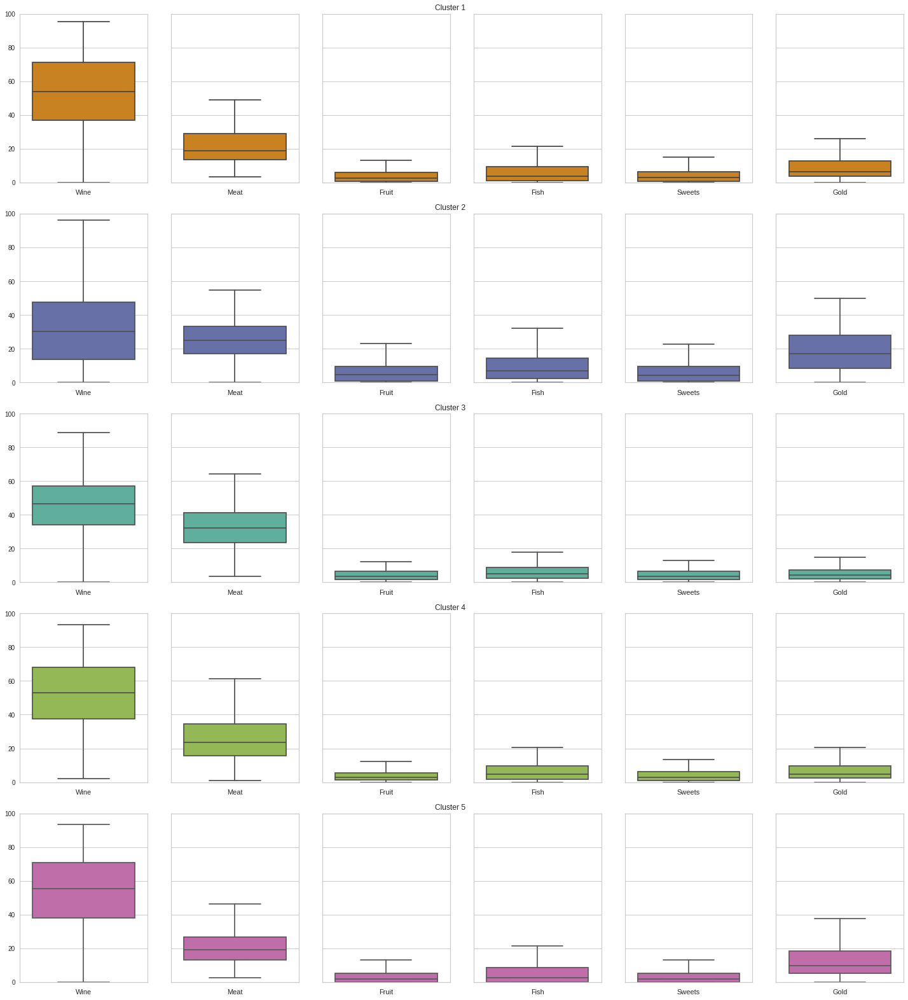

In [69]:
#Kinds of goods consumed
fig, axes = plt.subplots(5, 6, figsize=(20, 22), sharey=True)
#fig.suptitle('Goods preferrence by clusters', fontsize=20)
colors=palettable.cartocolors.qualitative.Vivid_7.mpl_colors
for i, value in enumerate(sorted(data_cleaned_clustered['Cluster'].unique())):
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Wines Frequency', showfliers=False, ax=axes[i, 0],color=colors[i])
    axes[i, 0].set_ylim(0, 100)
    axes[i, 0].set_xlabel('Wine')
    axes[i, 0].set_ylabel('')
    
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Meat Frequency', showfliers=False,   ax=axes[i, 1], color=colors[i])
    axes[i, 1].set_xlabel('Meat')
    axes[i, 1].set_ylabel('')
    
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Fruit Frequency', showfliers=False,   ax=axes[i, 2], color= colors[i])
    axes[i, 2].set_xlabel('Fruit')
    axes[i, 2].set_ylabel('')
    axes[i, 2].set_title(f'Cluster {value}', x=1)
    
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Fish Frequency', showfliers=False,   ax=axes[i, 3], color= colors[i])
    axes[i, 3].set_xlabel('Fish')
    axes[i, 3].set_ylabel('')
    
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Sweet Frequency', showfliers=False,   ax=axes[i, 4], color= colors[i])
    axes[i, 4].set_xlabel('Sweets')
    axes[i, 4].set_ylabel('')
    
    sns.boxplot(data=data_cleaned_clustered.query(f'Cluster == {value}'), y='Gold Frequency', showfliers=False,   ax=axes[i, 5], color= colors[i])
    axes[i, 5].set_xlabel('Gold')
    axes[i, 5].set_ylabel('')
    
plt.tight_layout()

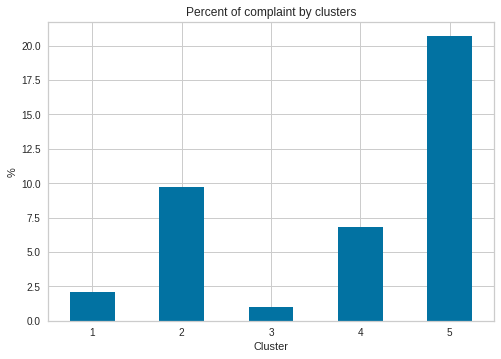

In [84]:
#Feedback--complain

complains_by_cluster = (data_cleaned_clustered.groupby(by='Cluster')['Complain'].sum().divide(data_cleaned_clustered[data_cleaned_clustered['Response']==1]['Cluster'].value_counts()).multiply(100))

ax = complains_by_cluster.plot(kind='bar', 
                               title='Percent of complaint by clusters',
                               ylabel='%', xlabel='Cluster',)


ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.show() #Cluster 5 highest

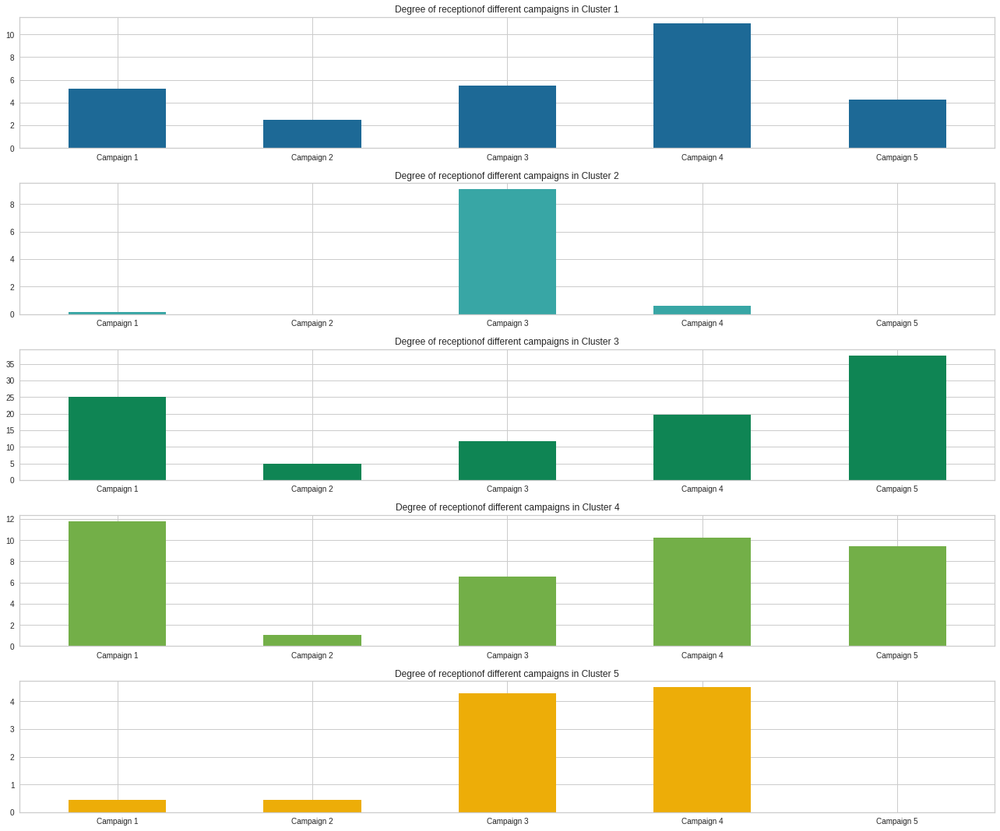

In [85]:
#Marketing-Campaign

fig, axes = plt.subplots(5, 1)
colors=palettable.cartocolors.qualitative.Prism_6.mpl_colors
for i in range(1, 6):
    ax = (data_cleaned_clustered.query(f'Cluster == {i}')[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']]
          .sum().divide(data_cleaned_clustered.query(f'Cluster == {i}').shape[0]).multiply(100)
          .plot(kind='bar', figsize=(18,15), title=f'Degree of receptionof different campaigns in Cluster {i}', ax=axes[i-1],color=colors[i]))
    ax.set_xticklabels(['Campaign 1', 'Campaign 2', 'Campaign 3', 'Campaign 4', 'Campaign 5'], rotation=0)
    #ax.set_(colors[i])
plt.tight_layout()